In [3]:
# Data Manipulation and Preprocessing
import numpy as np
import pandas as pd
import json
import labtools

# Data Visualization
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import warnings
# Suppress the SettingWithCopyWarning
warnings.filterwarnings('ignore')

# Web Interaction and Display
from IPython.display import Image, display, HTML

# Additional JavaScript for toggling code display in Jupyter Notebooks
HTML(
    """
<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script>
<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
 } else {
 $('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit"
    value="Click here to toggle on/off the raw code."></form>
"""
)

In [4]:
final_df = pd.read_csv('final_df.csv')

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">SUPPLEMENTARY NOTEBOOK 
        (2006-2010)</h2></center>
</div>

This notebook contains the implementation of the clustering method applied to the abstracts of research publications released between 2006 and 2010.

---

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">TOKEN VECTORIZATION</h2></center>
</div>

For the year 2006 and onwards, our dataset is composed of 1000 samples per year. The purpose of this is to reduce the computational complexity of our analysis.

In [5]:
# Get the 2006-2010 data
window = list(range(2006, 2011))
df_2006 = final_df[final_df.year.isin(window)]
df_2006 = labtools.get_sample(df_2006, window, sample_size=1000)

This is a snippet of a list of consolidated abstracts of two publications submitted between 2006 and 2010.

In [6]:
# Get the abstract of the 2006-2010 dataset
abs_2006 = df_2006.abstract.to_list()
print(abs_2006[:2])

['  Clustering in high-dimensional spaces is a difficult problem which is\nrecurrent in many domains, for example in image analysis. The difficulty is due\nto the fact that high-dimensional data usually live in different\nlow-dimensional subspaces hidden in the original space. This paper presents a\nfamily of Gaussian mixture models designed for high-dimensional data which\ncombine the ideas of dimension reduction and parsimonious modeling. These\nmodels give rise to a clustering method based on the Expectation-Maximization\nalgorithm which is called High-Dimensional Data Clustering (HDDC). In order to\ncorrectly fit the data, HDDC estimates the specific subspace and the intrinsic\ndimension of each group. Our experiments on artificial and real datasets show\nthat HDDC outperforms existing methods for clustering high-dimensional data\n', '  We study how the spread of computer viruses, worms, and other\nself-replicating malware is affected by the logical topology of the network\nover wh

We next create a matrix representing certain words on this list as a column and their corresponding frequencies within each abstract as values in the matrix. This matrix allows for quantitative analysis of the abstracts based on the occurrence of specific keywords or terms. 

To determine the optimal values for `min_df` and `max_df`, we created a heatmap that shows the sparsity of the TF-IDF matrix for different combinations of `min_df` and `max_df` values. The sparsity is calculated as the ratio of zero elements in the matrix to the total number of elements.

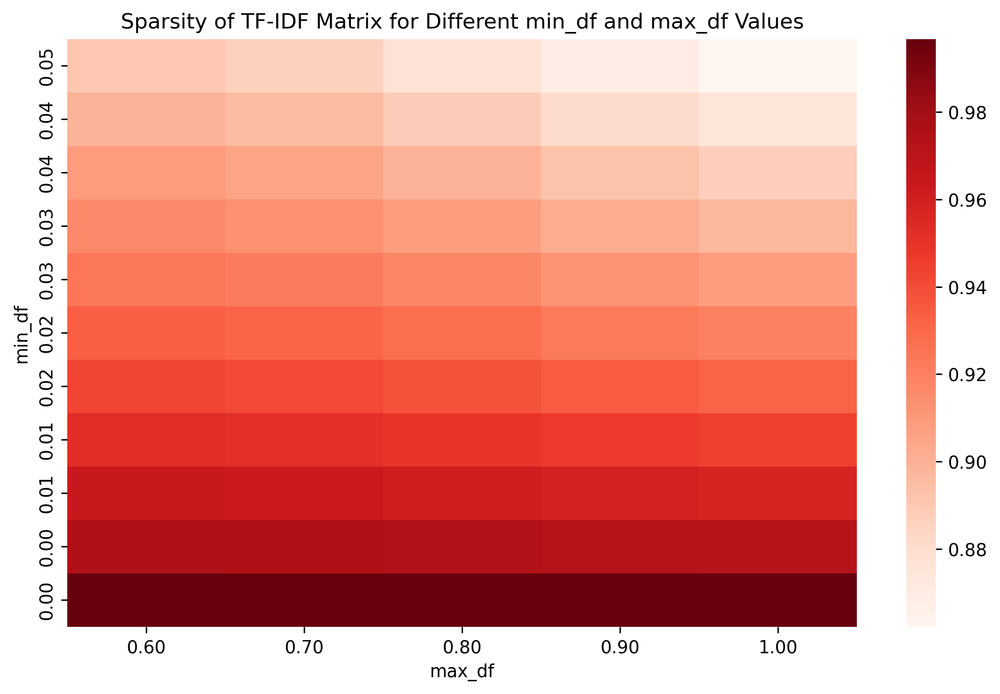

In [7]:
labtools.visualize_sparsity(abs_2006)

<center>
    <h6>
        <b>Figure 1. 
        </b> Sparsity of TF-IDF Matrix for Different <code>min_df</code> and<code>max_df</code> values
    </h6>
</center>

- **Lower right corner (high `min_df`, low `max_df`)**: This region has the lowest sparsity, indicating that most terms are included in the vocabulary due to the lenient filtering.
- **Upper left corner (low `min_df`, high `max_df`)**: This region has the highest sparsity, indicating that many terms have been excluded from the vocabulary due to the aggressive filtering of rare and common terms.
- **Diagonal trend**: As you move from the upper left corner to the lower right corner, the sparsity generally increases. This is because increasing `min_df` and decreasing `max_df` results in more aggressive filtering of the vocabulary.

The heatmap highlights the trade-off between sparsity and vocabulary size. A sparser matrix (higher sparsity) may be more computationally efficient, but it may also exclude important terms. A denser matrix (lower sparsity) includes more terms but may also include noise.

We chose the middle of the heatmap as the optimal region for the values of `min_df` and `max_df`, indicating a balance between including informative terms and excluding noise.

Let's also remove English and context-specific stopwords. Our resulting matrix looks like this:

In [8]:
df_tfidf_06 = labtools.vectorize_abstract(abs_2006, min_df=0.03, max_df=0.80)
df_tfidf_06.head(3)

,addition,algorithms,alpha,approximation,article,assumptions,asymptotic,asymptotically,behavior,bound,...,transition,tree,underlying,uniform,unknown,upper,values,variance,walk,weak
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<center>
    <h6>
        <b>Table 1. 
        </b>TF-IDF Matrix
    </h6>
</center>

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">DIMENSIONALITY REDUCTION</h2></center>
</div>

Next, we reduce the complexity of the dataset by decreasing the number of its dimensions. We first determine the number of singular vectors that would give us at least 90% of the variance explained using the `TruncatedSVD` method.

Number of components for at least 90% variance explained: 161


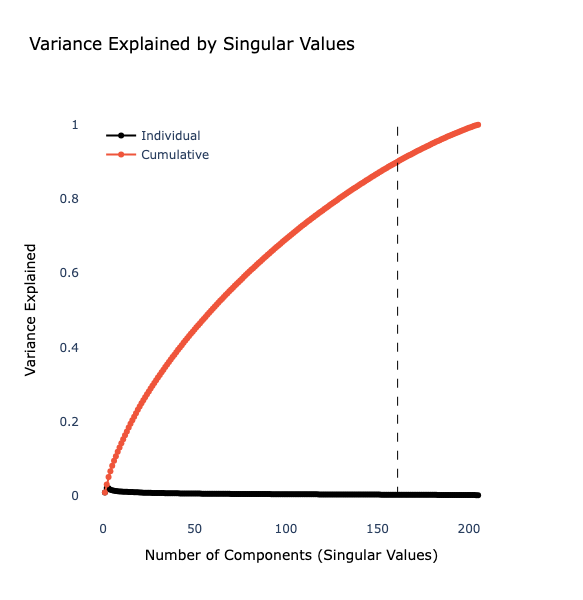

161

In [9]:
labtools.get_n_components(df_tfidf_06, show_viz=True)

<center>
    <h6>
        <b>Figure 2. 
        </b> Individual and Cumulative Variance Explained of the SV Components
    </h6>
</center>


We then proceed to reducing the number of dimensions of our dataset based on the initial check.

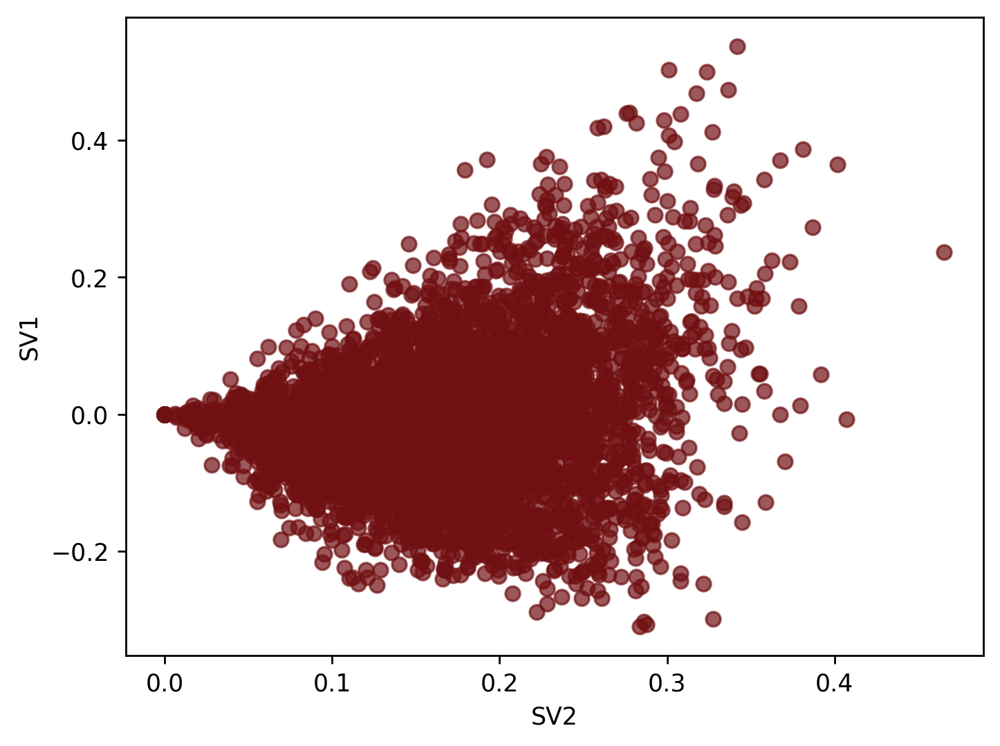

In [10]:
reduced_06 = (labtools.reduce_dimensions(labtools
                                         .get_n_components(df_tfidf_06,
                                                           show_viz=False),
                                         df_tfidf_06))
plt.figure(dpi=250)
plt.scatter(reduced_06[:, 0], reduced_06[:, 1], alpha=0.7, color='#711012')
plt.xlabel('SV2')
plt.ylabel('SV1');

<center>
    <h6>
        <b>Figure 3. 
        </b> The TF-IDF as projected to the first two singular vectors
    </h6>
</center>


<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">CLUSTERING</h2></center>
</div>

Optimal number of clusters: 7
Threshold distance: 5.511940


5.511940201198463

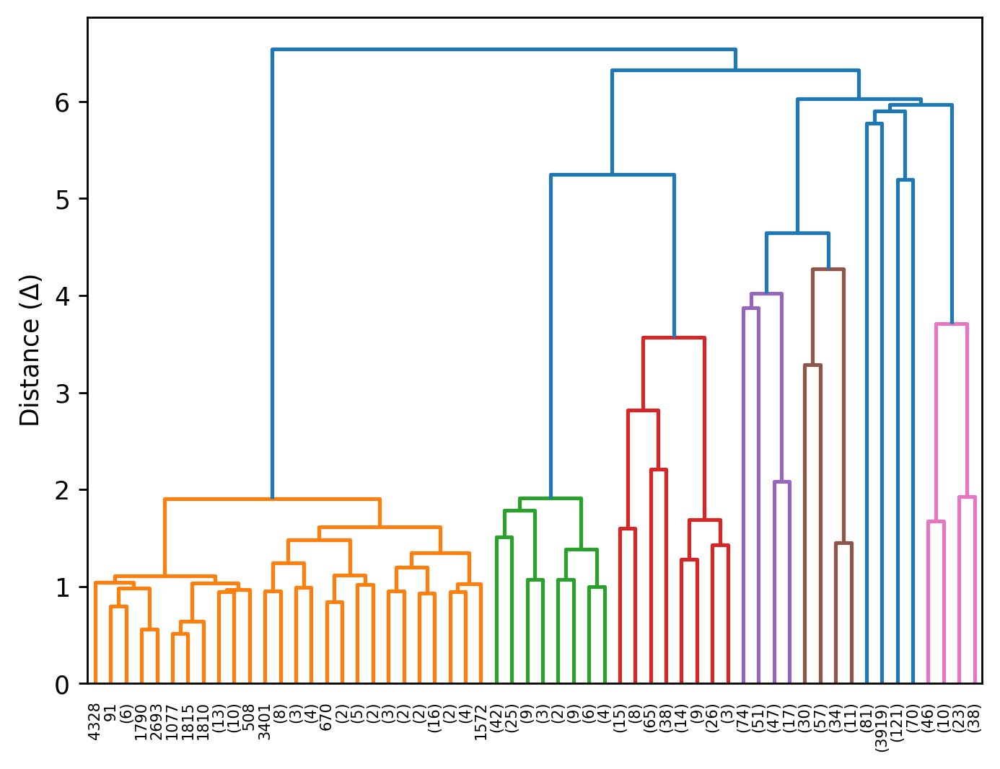

In [56]:
labtools.hierarchical_clustering(reduced_06)

<center>
    <h6>
        <b>Figure 4. 
        </b> Ward's Clustering Dendrogram Results
    </h6>
</center>


From the dendrogram, we see that the optimal number of clusters is two. However, it would be interesting to investigate the sub-clusters that were formed under each main cluster because we can see that one main cluster has more points, so it is possible that we can further find subgroups under it. Let's check these both.

<div style="background-color: #cbc6c6; padding: 10px 0;">
    <center><h4 style="color: #242424;font-weight:bold">EDA on Initial Clusters</h4></center>
</div>

This is what the clusters look when projected on the first two singular vectors:

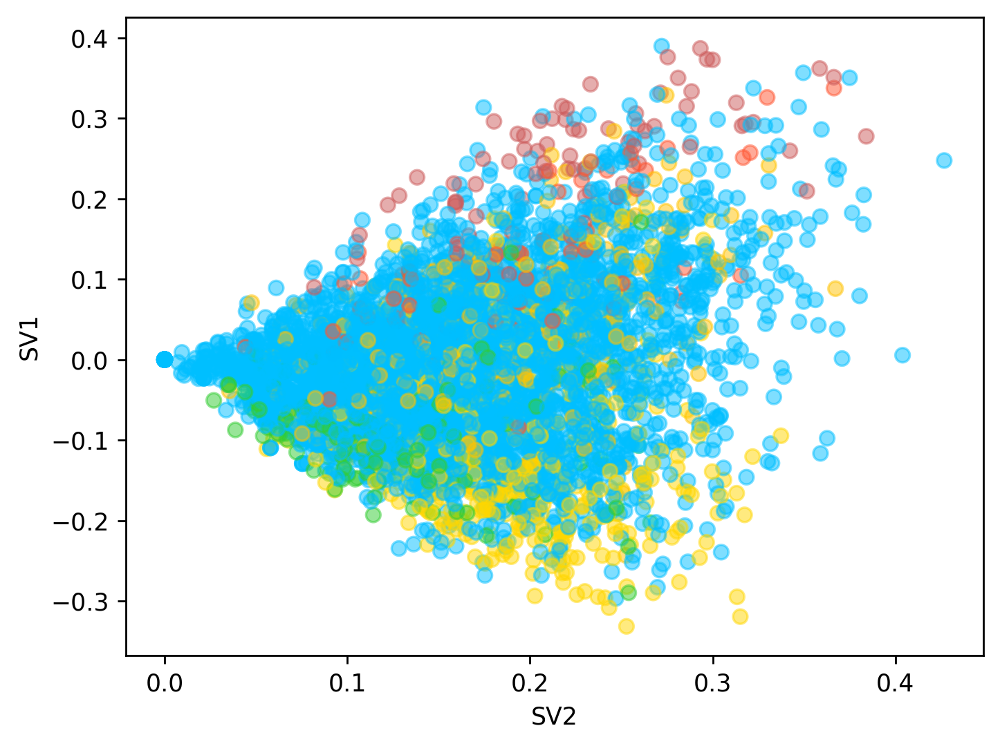

In [57]:
labtools.cluster_predict(reduced_06, df_2006, show_viz=True)

<center>
    <h6>
        <b>Figure 5. 
        </b> Clustering Results as Projected on the First Two Singular Vectors
    </h6>
</center>

Let's visualize the abstracts of the publications belonging to each main cluster using a word cloud to have an idea on what the cluster is all about.

In [58]:
clustered_df = labtools.cluster_predict(reduced_06, df_2006, show_viz=False,
                               get_updated_df=True)

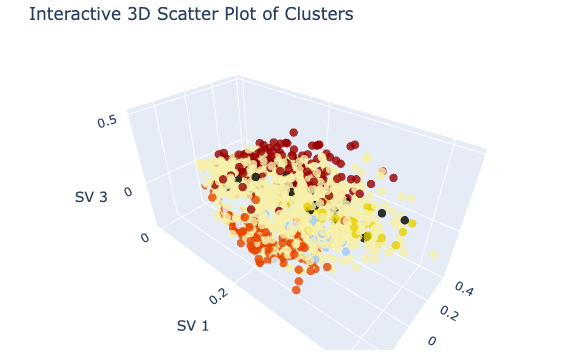

In [78]:
# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=reduced_06[:, 0],
    y=reduced_06[:, 1],
    z=reduced_06[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=clustered_df['cluster'],  # Color points based on cluster
        colorscale='blackbody',  # Choose a color scale
        opacity=0.8
    ),
    text=clustered_df['cluster'].astype(str)  # Add cluster labels as text
)])

# Set axis labels
fig.update_layout(scene=dict(
    xaxis_title='SV 1',
    yaxis_title='SV 2',
    zaxis_title='SV 3',
    aspectratio=dict(x=2, y=1, z=1)  # Adjust the aspect ratio as needed
))

# Adjust the layout to fill the entire space while keeping the controls visible
fig.update_layout(
    autosize=True,  # Enable autosizing to keep controls visible
    margin=dict(l=10, r=10, t=40, b=10),  # Adjust margin values for control visibility
)

# Add title to the plot
fig.update_layout(title='Interactive 3D Scatter Plot of Clusters')

# Show the plot
fig.show()


<center>
    <h6>
        <b>Figure 6. 
        </b> Clustering Results as Projected on the First Two Singular Vectors (3D)
    </h6>
</center>

#### **Cluster 1: 2006-2010**

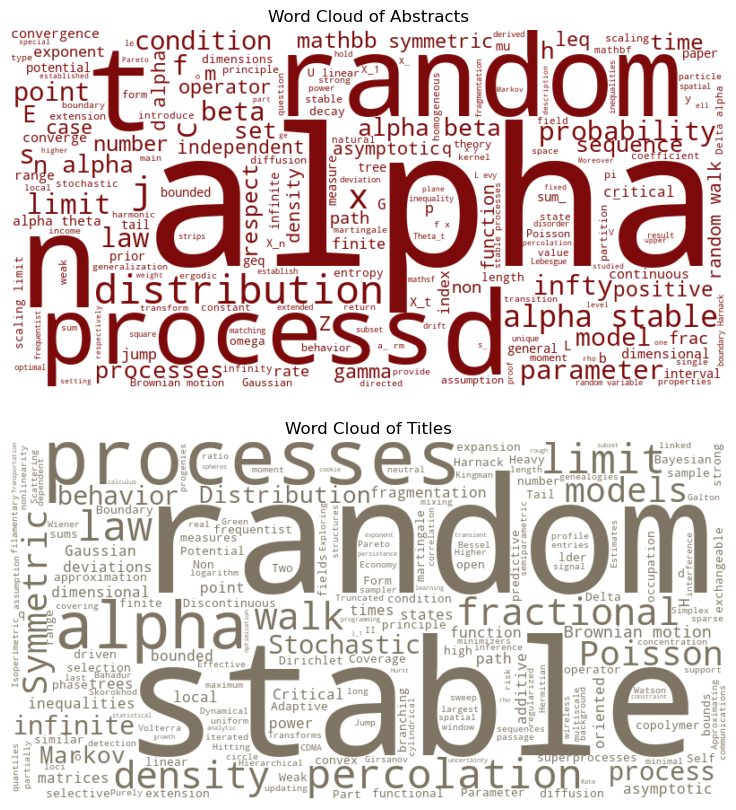

In [59]:
labtools.generate_wordclouds(clustered_df, cluster_number=1)

<center>
    <h6>
        <b>Figure 7. 
        </b> Word Cloud of Final Cluster 1
    </h6>
</center>

#### **Cluster 2: 2006-2010**

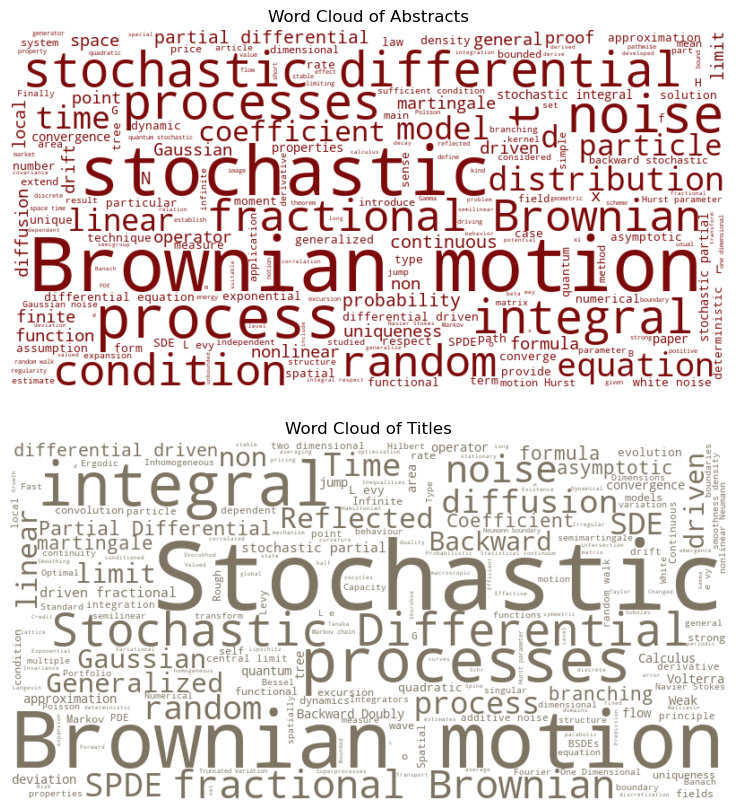

In [60]:
labtools.generate_wordclouds(clustered_df, cluster_number=2)

<center>
    <h6>
        <b>Figure 8. 
        </b> Word Cloud of Final Cluster 2
    </h6>
</center>

#### **Cluster 3: 2006-2010**

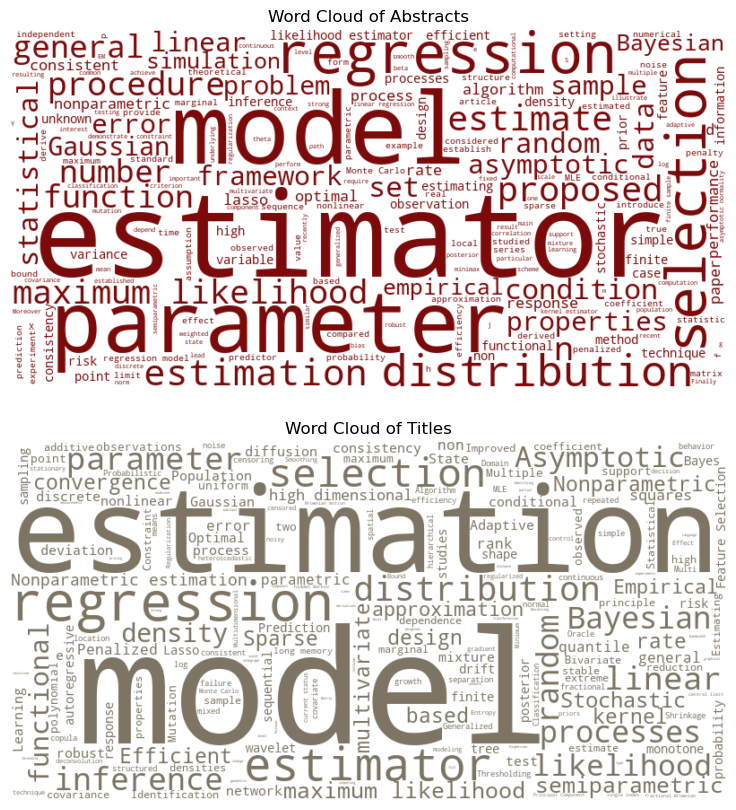

In [61]:
labtools.generate_wordclouds(clustered_df, cluster_number=3)

<center>
    <h6>
        <b>Figure 9. 
        </b> Word Cloud of Final Cluster 3
    </h6>
</center>

#### **Cluster 4: 2006-2010**

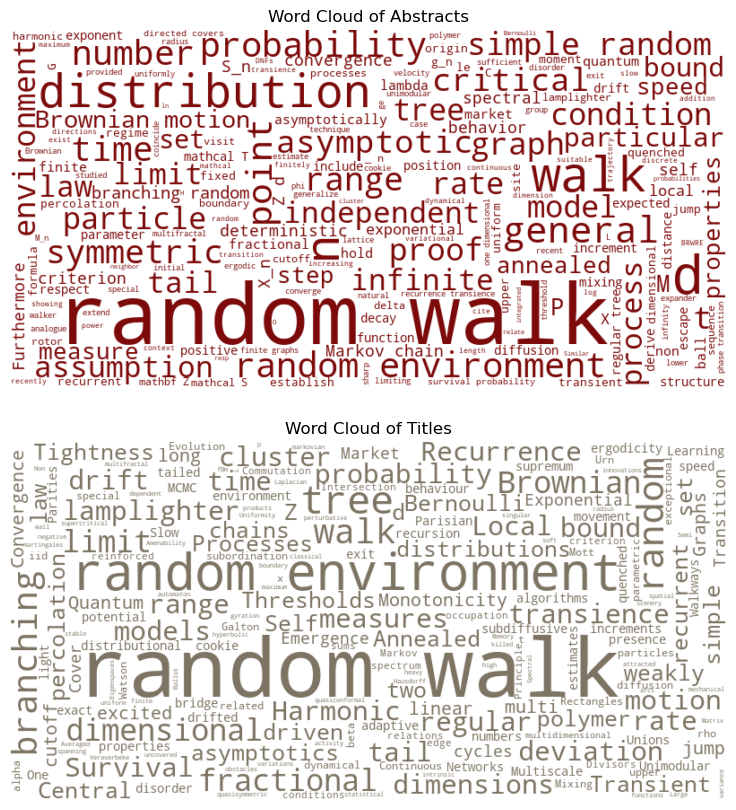

In [62]:
labtools.generate_wordclouds(clustered_df, cluster_number=4)

<center>
    <h6>
        <b>Figure 10. 
        </b> Word Cloud of Final Cluster 4
    </h6>
</center>

#### **Cluster 5: 2006-2010**

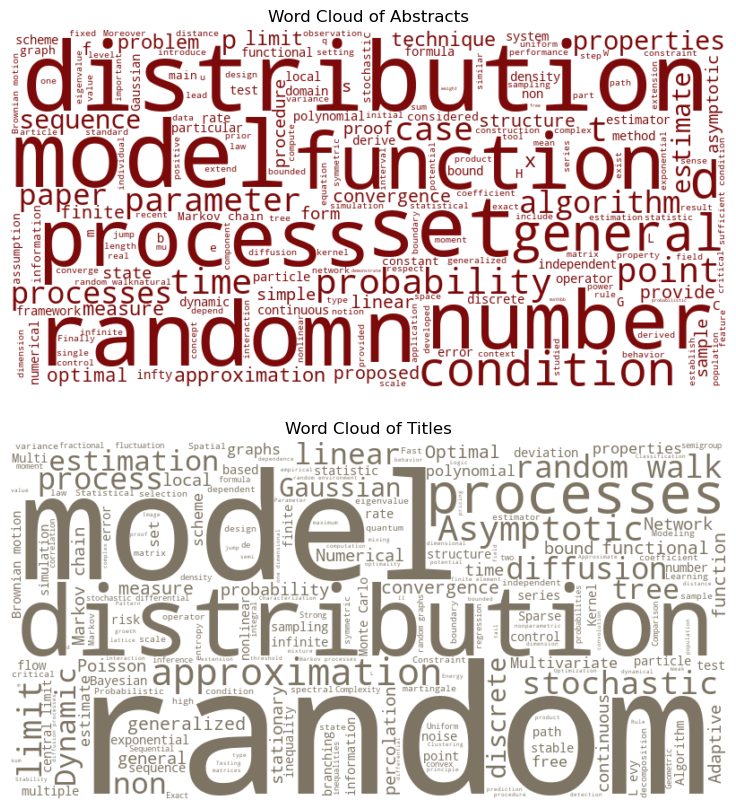

In [63]:
labtools.generate_wordclouds(clustered_df, cluster_number=5)

<center>
    <h6>
        <b>Figure 11. 
        </b> Word Cloud of Final Cluster 5
    </h6>
</center>

#### **Cluster 6: 2006-2010**

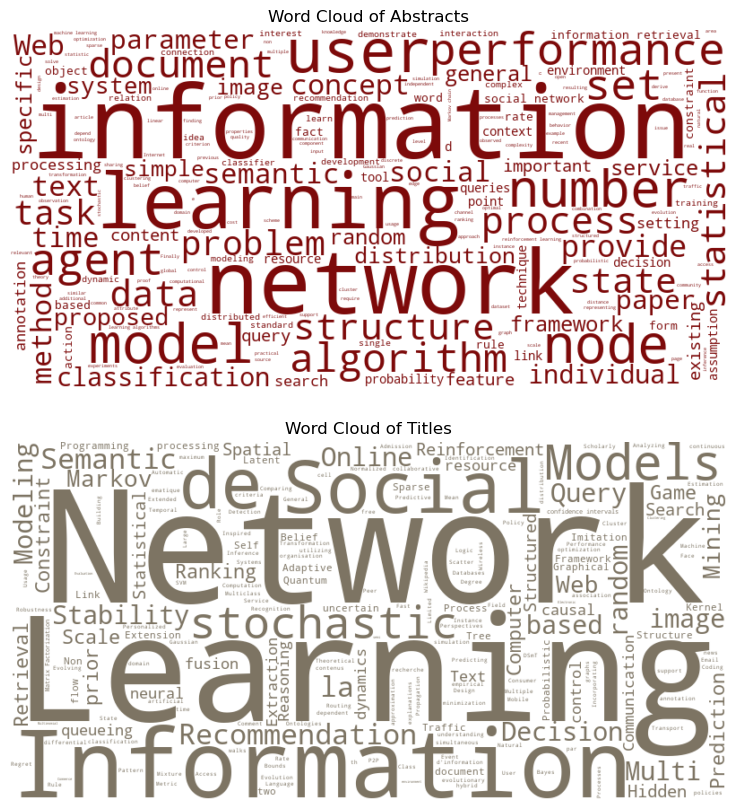

In [64]:
labtools.generate_wordclouds(clustered_df, cluster_number=6)

<center>
    <h6>
        <b>Figure 12. 
        </b> Word Cloud of Final Cluster 6
    </h6>
</center>

#### **Cluster 7: 2006-2010**

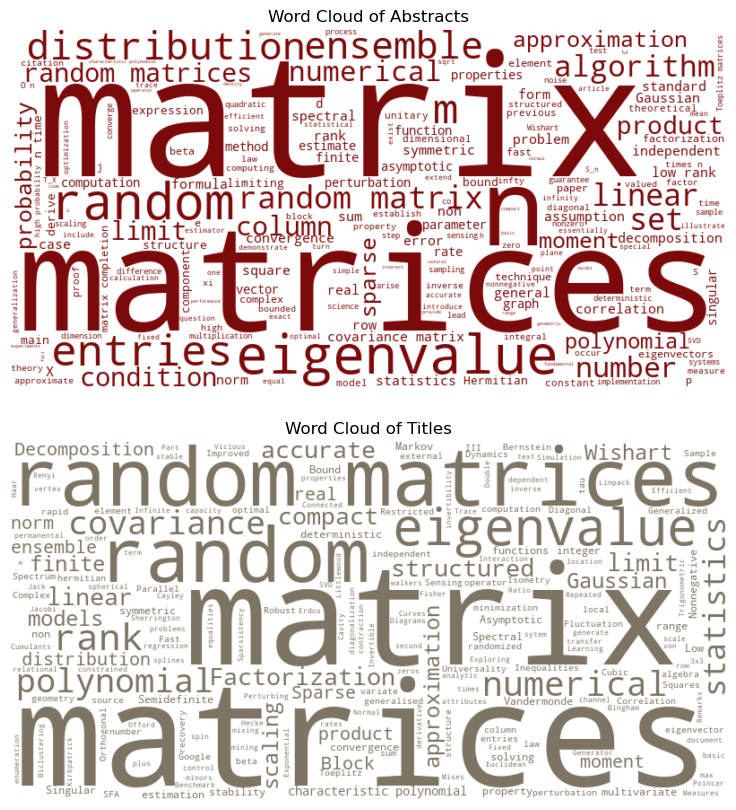

In [65]:
labtools.generate_wordclouds(clustered_df, cluster_number=7)

<center>
    <h6>
        <b>Figure 13. 
        </b> Word Cloud of Final Cluster 7
    </h6>
</center>

**How imbalanced are our main clusters between 2006 and 2010?**

As we can see, Cluster 3 has significantly more points than Cluster 1. However, based on the dendrogram, we were able to capture the underlying nuances of the main clusters, so even though it the distribution of points remains unbalanced, we attribute this to the inherent characteristic of the dataset, that is, perhaps between 2006 and 2011, research interests were indeed about Cluster 5.

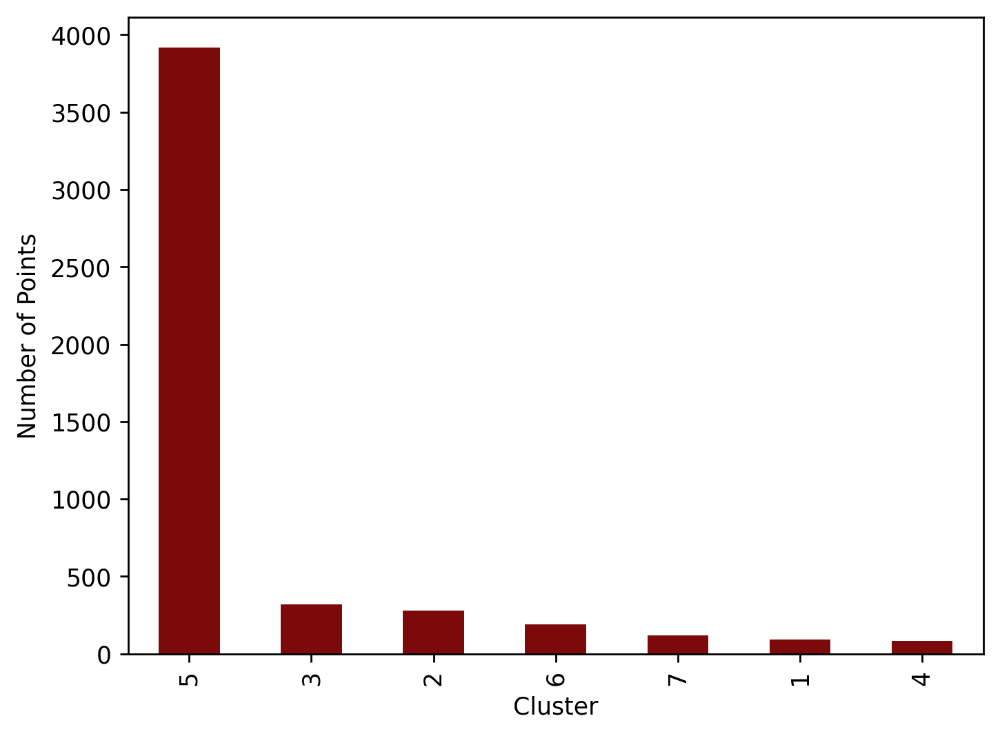

In [79]:
plt.figure(dpi=250)
clustered_df.cluster.value_counts().plot(kind='bar', color='#7d0a0a',
                                         xlabel='Cluster',
                                         ylabel='Number of Points');

<center>
    <h6>
        <b>Figure 14. 
        </b> Visualizing the Distribution of Points to the Initial Clusters
    </h6>
</center>

<div style="background-color:#711012; padding: 10px 0;">
    <center><h2 style="color: white; font-weight:bold">CLUSTER INTERPRETATION</h2></center>
</div>

#### **Cluster 1: Stochastic Processes and Probability Models**
- **Abstract Keywords**: alpha, random, process, distribution, symmetric, probability
- **Title Keywords**: random, stable, process, alpha, density, percolation, fractional, Poisson, limit, walk
- **Insights**:
  - While this cluster similarly revolves around stochastic processes, there is a new area of interest: alpha-stable processes and its applications, possibly percolation theory.

#### **Cluster 2: Fractional Stochastic Calculus and Applications**
- **Abstract Keywords**: Brownian motion, fractional, stochastic, noise, integral, condition
- **Title Keywords**: stochastic, Brownian motion, fractional, integral, processes

#### **Cluster 3: Statistical Estimation and Regression Modeling**
- **Abstract Keywords**: estimator, parameter, regression, maximum, likelihood, selection, distribution
- **Title Keywords**: estimation, model, regression, asymptotic, inference, likelihood

#### **Cluster 4: Random Walks and Harmonic Functions**
- **Abstract Keywords**: random, walk, distribution, probability
- **Title Keywords**: random, walk, Harmonic, fractional

#### **Cluster 5: Stochastic Modeling**
- **Abstract Keywords**: random, distribution, function, process, probability
- **Title Keywords**: random, distribution, model, processes, stochastic

#### **Cluster 6: Social Network Learning and Information Retrieval**
- **Abstract Keywords**: information, learning, network, user, document, node, performance
- **Title Keywords**: network, learning, information, stochastic, social, retrieval
- **Insights**:
  - Compared to the network cluster in 1995, which was more on neural networks, this cluster seems to emphasize studies on networks that are centered on social media and online networks.
  - The emergence of terms like “user” and “recommendation” also highlights a shift towards user-centric research, focusing on user behavior, preferences, and recommendations within networks.
  - The appearance of “statistical” and “stochastic” in the abstract and title indicates a trend towards employing statistical and stochastic methods to analyze network data and learning processes.

#### **Cluster 7: Linear Algebra and Random Matrix**
- **Abstract Keywords**: matrix, eigenvalue, random
- **Title Keywords**: matrix, random, eigenvalue

#### **Notes**
- Clusters 1, 2, 4, and 5 could be merged under: Stochastic Processes, Modelling, and Probability Theory.
- **Interesting observations**
  - Novel areas of research surfaced during this time frame: statistical estimation and regression modeling and linear algebra and random matrix.
  - On the other hand, clusters which seem highly similar to the previous period exhibit new areas of interest as well.